### **import library**

In [3]:
''' from google.colab import drive
drive.mount('/content/drive') '''

" from google.colab import drive\ndrive.mount('/content/drive') "

In [21]:
# Instalasi untuk Tesseract OCR Engine dan library Python-nya
print("Menginstal Tesseract OCR Engine...")
!sudo apt-get update -qq
!sudo apt-get install tesseract-ocr -qq
!pip install pytesseract -q

# Instalasi untuk library konversi PDF ke Gambar
# (Diperlukan jika alur kerja Anda dimulai dari file .pdf)
print("\nMenginstal library untuk pemrosesan PDF...")
!sudo apt-get install poppler-utils -qq
!pip install pdf2image -q

print("\nSemua dependensi yang diperlukan sudah siap.")

Menginstal Tesseract OCR Engine...
W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)

Menginstal library untuk pemrosesan PDF...

Semua dependensi yang diperlukan sudah siap.


In [22]:
pip install opencv-python

In [23]:
import cv2
import numpy as np
import os
from google.colab.patches import cv2_imshow
import re
from PIL import Image
from pdf2image import convert_from_path

### **Setup Folder**

In [27]:
folder_input_png = '/content/Dataset-Fix-banget'

folder_output_final = '/content/Dataset-Restored/'

os.makedirs(folder_output_final, exist_ok=True)

### **Pengumpulan File**

- Menggunakan glob untuk mencari dan mengumpulkan semua file yang memiliki ekstensi .png dari dalam folder input.

In [28]:
import glob

daftar_png = glob.glob(os.path.join(folder_input_png, '*.png'))
print(f"Ditemukan {len(daftar_png)} file PNG untuk diproses.")
print("-" * 50)

Ditemukan 64 file PNG untuk diproses.
--------------------------------------------------


### **definisikan Fungsi Rotasi**

mendefinisikan fungsi `rotate_image` untuk memutar gambar tanpa ada bagian yang terpotong.

In [29]:
def rotate_image(image, angle):
    """Memutar gambar dengan padding untuk mencegah pemotongan."""
    (h, w) = image.shape[:2]
    (cX, cY) = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D((cX, cY), angle, 1.0)
    cos = np.abs(M[0, 0]); sin = np.abs(M[0, 1])
    nW = int((h * sin) + (w * cos)); nH = int((h * cos) + (w * sin))
    M[0, 2] += (nW / 2) - cX; M[1, 2] += (nH / 2) - cY
    return cv2.warpAffine(image, M, (nW, nH), borderMode=cv2.BORDER_CONSTANT, borderValue=(255,255,255))

### **Setup Path**
Menentukan lokasi file gambar input yang akan diproses dan nama untuk file PDF output.

In [40]:
PATH_GAMBAR_INPUT = "/content/Dataset-Fix-banget/Salinan CV_ANNISA ZAHRA FITRIA - Annisa Zahra_rot_90_noisy.png"
PATH_PDF_OUTPUT = "/content/hasil_restorasi2.pdf"

## **Proses Restorasi**

1. **Menghilangkan Noise**

Membersihkan gambar dari bintik-bintik (noise) menggunakan filter Median Blur.
2. **Memperbaiki Kemiringan**

Secara otomatis mendeteksi sudut kemiringan dari nama file (contoh: _rot_90_) lalu memutar gambar untuk meluruskannya.

3. **Menyimpan ke PDF**

Mengambil gambar yang sudah bersih dan lurus, lalu menyimpannya sebagai sebuah file PDF.

Memulai Uji Coba Restorasi pada Satu Gambar...
Memproses file: Salinan CV_ANNISA ZAHRA FITRIA - Annisa Zahra_rot_90_noisy.png

[SEBELUM] Gambar Asli dengan Distorsi


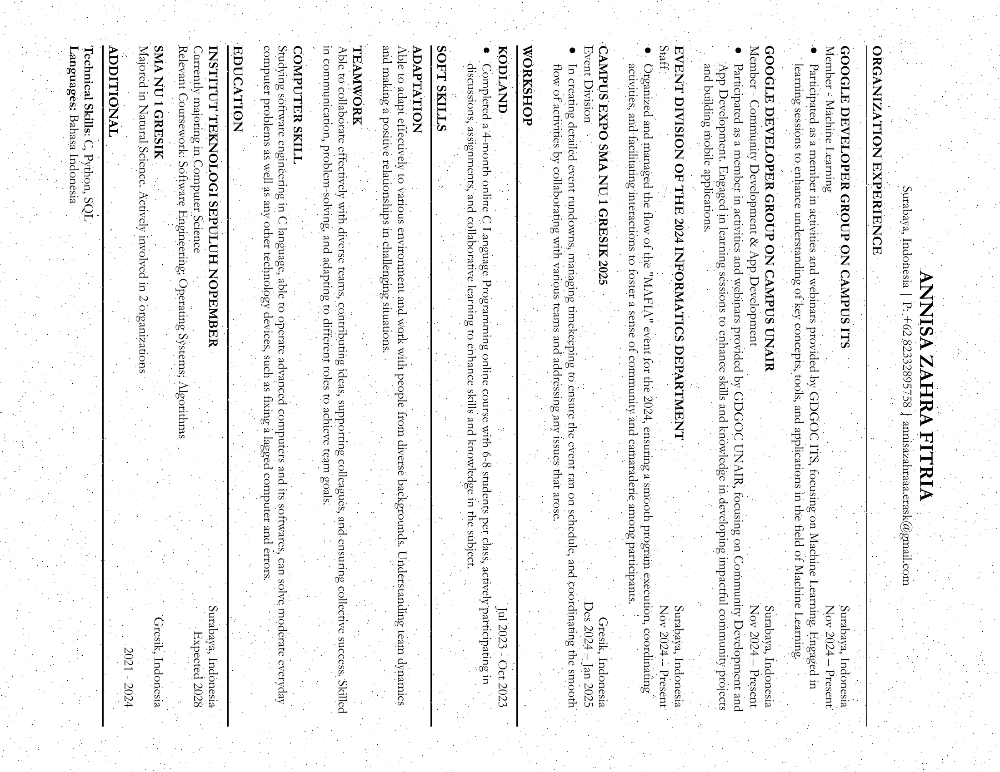

------------------------------------------------------------

-> Langkah 1: Menghilangkan noise...
   Noise dihilangkan.

-> Langkah 2: Memperbaiki kemiringan...
   Sudut dari nama file: 90.0 der. Koreksi: -90.00 der.
   Rotasi selesai.

-> Langkah 3: Menyimpan hasil berwarna ke PDF...
   Selesai! Disimpan sebagai hasil_restorasi2.pdf

[SESUDAH] Gambar Setelah Direstorasi (Berwarna)


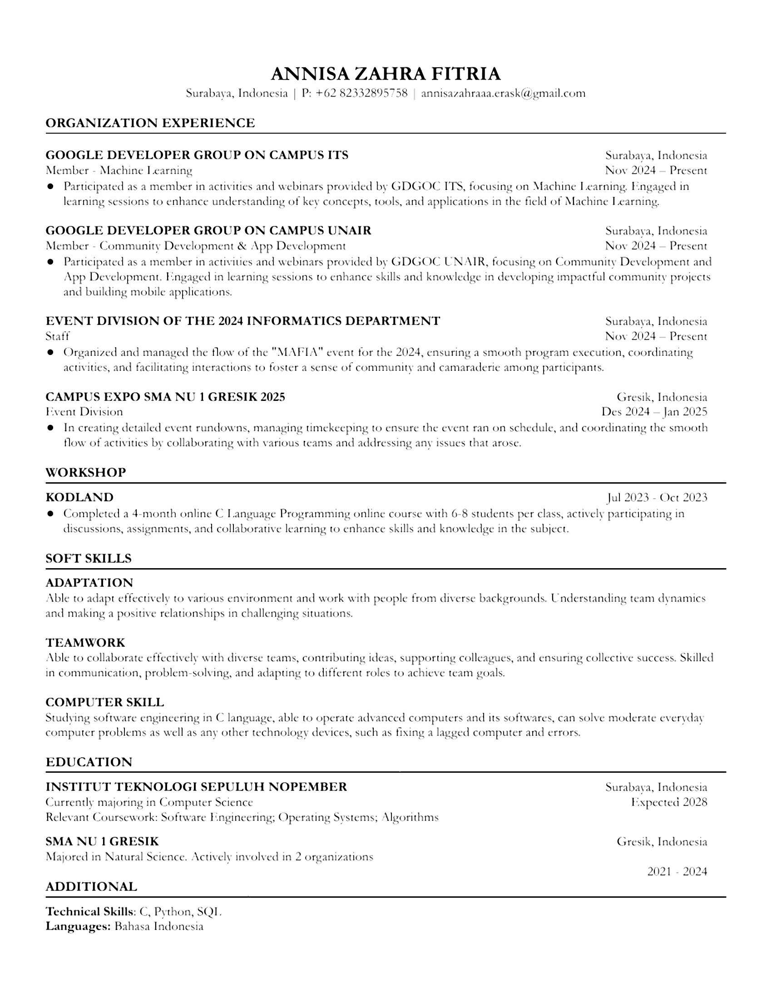

In [41]:
print("="*60)
print("Memulai Uji Coba Restorasi pada Satu Gambar...")
print("="*60)

if not os.path.exists(PATH_GAMBAR_INPUT):
    print(f"ERROR: File tidak ditemukan di '{PATH_GAMBAR_INPUT}'.")
    print("Silakan salin path file yang benar dari panel file di sebelah kiri.")
else:
    nama_file_png = os.path.basename(PATH_GAMBAR_INPUT)
    print(f"Memproses file: {nama_file_png}")

    try:
        gambar_rusak = cv2.imread(PATH_GAMBAR_INPUT)

        print("\n[SEBELUM] Gambar Asli dengan Distorsi")
        cv2_imshow(gambar_rusak)
        print("-" * 60)

        print("\n-> Langkah 1: Menghilangkan noise...")
        gambar_denoised = cv2.medianBlur(gambar_rusak, 3)
        print("   Noise dihilangkan.")

        print("\n-> Langkah 2: Memperbaiki kemiringan...")
        match = re.search(r'_rot_(-?[\d.]+)', nama_file_png)

        gambar_lurus = gambar_denoised

        if match:
            original_angle = float(match.group(1))
            correction_angle = -original_angle
            print(f"   Sudut dari nama file: {original_angle} der. Koreksi: {correction_angle:.2f} der.")

            if original_angle == 90:
                gambar_lurus = cv2.rotate(gambar_denoised, cv2.ROTATE_90_COUNTERCLOCKWISE)
            else:
                gambar_lurus = rotate_image(gambar_denoised, correction_angle)
            print("   Rotasi selesai.")
        else:
            print("   Peringatan: Tidak ada info rotasi di nama file. Melewati koreksi rotasi.")

        print(f"\n-> Langkah 3: Menyimpan hasil berwarna ke PDF...")
        gambar_lurus_rgb = cv2.cvtColor(gambar_lurus, cv2.COLOR_BGR2RGB)
        pil_image = Image.fromarray(gambar_lurus_rgb)
        pil_image.save(PATH_PDF_OUTPUT, "PDF", resolution=100.0)
        print(f"   Selesai! Disimpan sebagai {os.path.basename(PATH_PDF_OUTPUT)}")

        print("\n[SESUDAH] Gambar Setelah Direstorasi (Berwarna)")
        cv2_imshow(gambar_lurus)
        print("="*60)


    except Exception as e:
        print(f"   Terjadi error saat memproses {nama_file_png}: {e}")

## **konfigurasi Path dan Parameter**

In [42]:
PATH_PDF_INPUT = "/content/hasil_restorasi2.pdf"

KERNEL_SIZE_PENEBALAN = (2, 2)

PATH_ENHANCED_PDF_OUTPUT = "/content/hasil_final_ditebalkan2.pdf"

Memulai Alat 2: Penebalan Teks Berwarna...

[SEBELUM] Gambar berwarna dari PDF yang akan ditebalkan:


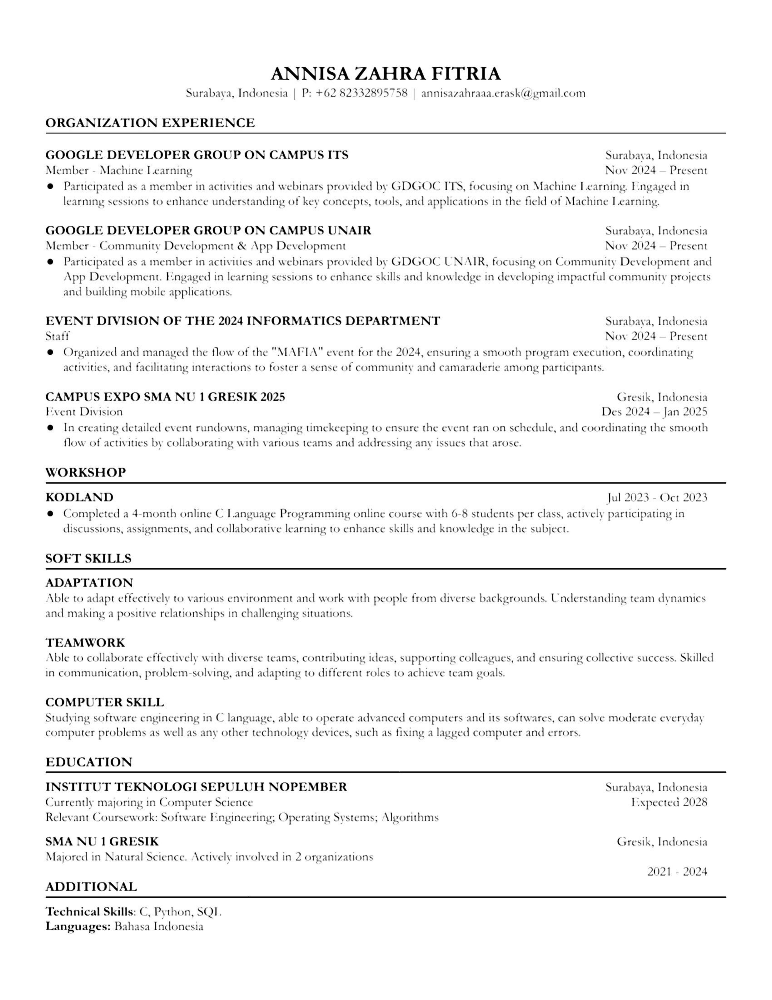

------------------------------------------------------------
-> Membuat 'peta' lokasi teks (mask)...
-> Menebalkan 'peta' teks dengan kernel (2, 2)...
-> Menerapkan 'peta' tebal ke gambar berwarna asli...
-> Menyimpan hasil ke /content/hasil_final_ditebalkan2.pdf...

[SESUDAH] Hasil Akhir dengan Teks Ditebalkan (Warna Dipertahankan)


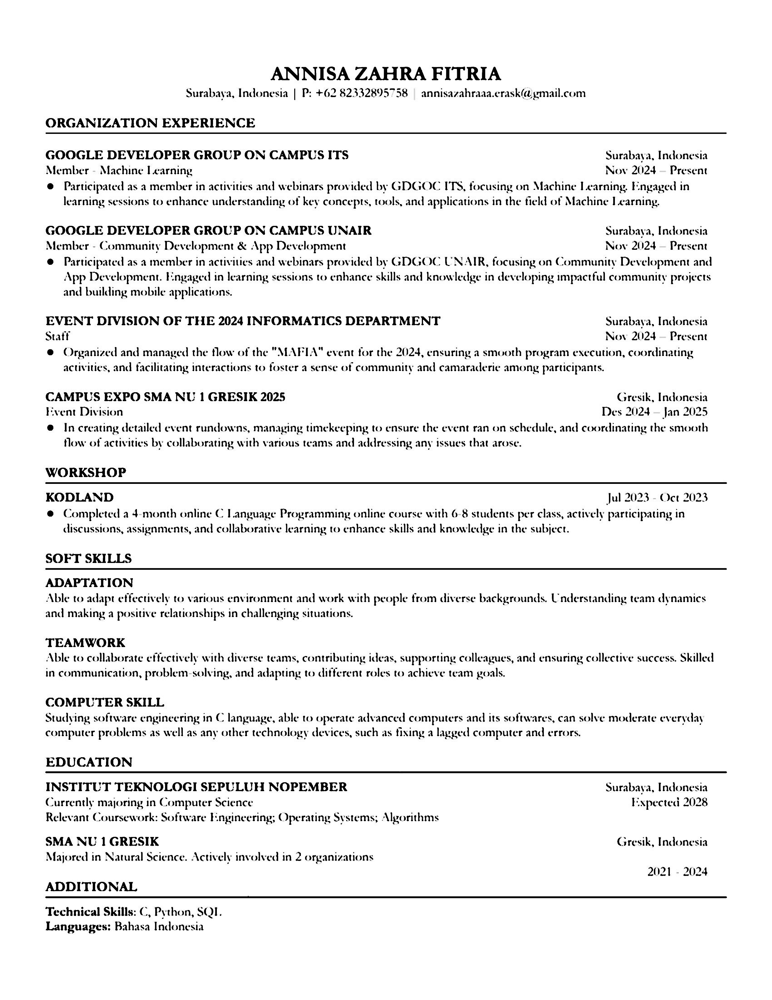


--- Proses Alat 2 Selesai! ---


In [43]:
print("="*60)
print("Memulai Alat 2: Penebalan Teks Berwarna...")
print("="*60)

# Membaca dan Memuat Gambar dari PDF
if not os.path.exists(PATH_PDF_INPUT):
    print(f"ERROR: File PDF input tidak ditemukan di '{PATH_PDF_INPUT}'.")
else:
    try:
        image_pil = convert_from_path(PATH_PDF_INPUT, first_page=1, last_page=1)[0]
        gambar_berwarna_input = cv2.cvtColor(np.array(image_pil), cv2.COLOR_RGB2BGR)

        # Menampilkan Gambar Sebelum Diproses
        print("\n[SEBELUM] Gambar berwarna dari PDF yang akan ditebalkan:")
        cv2_imshow(gambar_berwarna_input)
        print("-" * 60)

        # Membuat "Peta" Lokasi Teks (Mask)
        print("-> Membuat 'peta' lokasi teks (mask)...")
        gambar_gray = cv2.cvtColor(gambar_berwarna_input, cv2.COLOR_BGR2GRAY)
        _, text_mask = cv2.threshold(gambar_gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

        # Menebalkan "Peta" Teks (Dilasi)
        if KERNEL_SIZE_PENEBALAN is not None:
            print(f"-> Menebalkan 'peta' teks dengan kernel {KERNEL_SIZE_PENEBALAN}...")
            kernel = np.ones(KERNEL_SIZE_PENEBALAN, np.uint8)
            thick_text_mask = cv2.dilate(text_mask, kernel, iterations=1)
        else:
            print("-> Tidak ada penebalan, menggunakan mask asli.")
            thick_text_mask = text_mask


        # Menerapkan Penebalan pada Gambar Asli
        print("-> Menerapkan 'peta' tebal ke gambar berwarna asli...")
        gambar_hasil = gambar_berwarna_input.copy()
        gambar_hasil[thick_text_mask == 255] = [0, 0, 0]

        # Menyimpan Hasil Akhir ke PDF
        print(f"-> Menyimpan hasil ke {PATH_ENHANCED_PDF_OUTPUT}...")
        gambar_hasil_rgb = cv2.cvtColor(gambar_hasil, cv2.COLOR_BGR2RGB)
        pil_image_final = Image.fromarray(gambar_hasil_rgb)
        pil_image_final.save(PATH_ENHANCED_PDF_OUTPUT, "PDF", resolution=100.0)


        # Menampilkan Hasil Akhir
        print("\n[SESUDAH] Hasil Akhir dengan Teks Ditebalkan (Warna Dipertahankan)")
        cv2_imshow(gambar_hasil)
        print("\n--- Proses Alat 2 Selesai! ---")
        print("="*60)

    except Exception as e:
        print(f"   Terjadi error: {e}")